# Frame definitions
14/03/24

Canonical frame definitions in ePSproc:

- Molecules:
    - Highest molecular symmetry axis is aligned along the $z$-axis.
    - Spherical harmonics referenced to the same $z$-axis.
    - MF-PADs: same definition.
- E-fields and polarization geometry.
    - Linear polarization ($p=0$) case has the _polarization_ axis aligned along the $z$-axis.
    - Circ. polarization ($p=\pm1$) case has the _propagation_ axis aligned along the $z$-axis.
    - For other polarization states (mixed $p$ terms), arb frame definitions may be used.
- Frame rotations/comparisons
    - In general, E-fields may be rotated to define a particular polarization geometry in the MF (e.g. x-pol light relative to the molecular axis).
    - Frame rotations of PADs may also be performed.
- Aligned distributions
    - Default case assumes same $z$-axis for AF alignment axis and E-field.
    - Again, frame rotations of the E-field may be applied to define different polarization geometries.

This notebook gives more details and examples, including frame rotations.

TODO: tidy up plots/plotter backends.

## General spherical basis

In general, functions are described as expansions in spherical harmonics $Y_{L,M}$, with the $z$-axis corresponding to the symmetry axis, i.e. functions $Y_{L,0}$ will also peak along the $z$-axis. See the [Working with Spherical Haromics docs](../special_topics/ePSproc_docs_working_with_spherical_harmonics_200922.html) for more details.

Similarly, electric fields are described in a spherical basis, with components $e_p$, where $p={-1,0,1}$.

- $p=0$ only for linear polarization.
- $p=\pm1$ only for circular polarization (by convention $p=-1$ for LCP and $p=+1$ for RCP).
- Arb pol states may have a mixture of terms.

Note that $L=1$ only here, so these states correspond to spherical harmonics $Y_{1,p}$. For more general information see, e.g., [wikipedia](https://en.wikipedia.org/wiki/Spherical_basis), and Zare p209.

The spherical basis terms can be related to the E-field in the $(x,y)$ basis:

$e_+ = -\frac{1}{\sqrt 2} e_x - \frac{i}{\sqrt 2} e_y$

$e_- = +\frac{1}{\sqrt 2} e_x - \frac{i}{\sqrt 2} e_y$

$e_0=e_z$

i.e.

$e_{\pm} = \mp\frac{1}{\sqrt 2}(e_x \pm ie_y)$

Inverse terms:

$e_x = -\frac{1}{\sqrt 2} e_+ + \frac{1}{\sqrt 2} e_-$

$e_y = +\frac{i}{\sqrt 2} e_+ + \frac{i}{\sqrt 2} e_-$

This can also be expressed as [a transformation matrix](https://en.wikipedia.org/wiki/Spherical_basis#Change_of_basis_matrix).

### E-fields in circular basis

The conventional $(L,R)$ basis is similar, but note that it is phase flipped relative to the $e_p$ basis:

$|L\rangle=e_{-}$

$|R\rangle=-e_{+}$

Which follows from [the standard definitions](https://en.wikipedia.org/wiki/Circular_polarization#Mathematical_description) (noting that the choice of $L$ and $R$ is arbitrary):

${ |e_{L,R} \rangle ={1 \over {\sqrt{2}}}{\begin{pmatrix}e_x\\\pm ie_y\end{pmatrix}}\exp \left(i\alpha _{x}\right)}$

If basis vectors are defined such that:

${\displaystyle |\mathrm {R} \rangle \ {\stackrel {\mathrm {def} }{=}}\ {1 \over {\sqrt {2}}}{\begin{pmatrix}1\\+i\end{pmatrix}}}$

and:

${\displaystyle |\mathrm {L} \rangle \ {\stackrel {\mathrm {def} }{=}}\ {1 \over {\sqrt {2}}}{\begin{pmatrix}1\\-i\end{pmatrix}}}$

## Numerical examples - setting E-field pol states manually

Polarization states defined as dipole components $e_p$, corresponding to spherical harmonic terms $Y_{1,p}$. For linear light, $p=0$, for left circ. pol. (LCP) $p=-1$ only, and for right circ. pol. $p=+1$ only.

The $z$-axis is usually defined for the linear pol. case.

Use general $Y_{lm}$ functionality, or Epol class.

In [1]:
# Set specific LM coeffs by numpy array with setBLMs, items are [l,m,value]
from epsproc.sphCalc import setBLMs
import epsproc as ep
import numpy as np

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


* Set Holoviews with bokeh.
* pyevtk not found, VTK export not available. 


### Linear polarization ($p=0$), definition of $z$-axis

In [2]:
linearPol = setBLMs(np.array([[1,0,1],[1,-1,0],[1,1,0]]))   # Note different index
# linearPol = setBLMs([1,0,1])
linearPol

<xarray.DataArray 'BLM' (BLM: 3, t: 1)>
array([[1],
       [0],
       [0]])
Coordinates:
  * BLM      (BLM) MultiIndex
  - l        (BLM) int64 1 1 1
  - m        (BLM) int64 0 -1 1
  * t        (t) int64 0
Attributes:
    dataType:   BLM
    long_name:  Beta parameters
    units:      arb
    harmonics:  {'dtype': 'Complex harmonics', 'kind': 'complex', 'normType':...

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.4886025119029199+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=pl.
*** Plotting for [1,1,0]


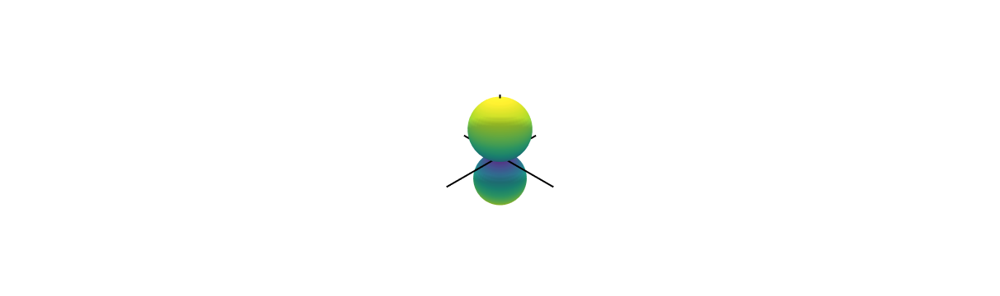

In [3]:
# Plot pol state - NOTE CURRENTLY NEED SQUEEZE HERE?
# ALSO fails for singleton case?
Itp, fig = ep.sphFromBLMPlot(linearPol.squeeze(drop=True), plotFlag = True,
                             backend='pl')  #, facetDims=['t'])

### Circular polarization ($p=\pm1$)

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.34460715010224785-0.022124513098986137j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=pl.
*** Plotting for [1,1,0]


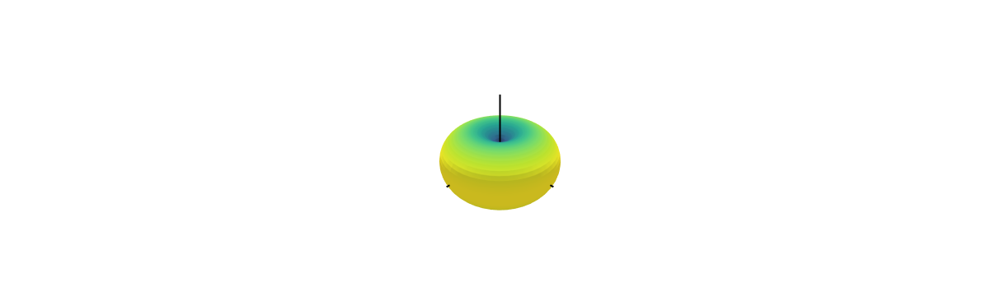

In [4]:
# LCP = setBLMs([1,-1,1])   # Note different index
LCP = setBLMs(np.array([[1,0,0],[1,-1,1],[1,1,0]]))
Itp, fig = ep.sphFromBLMPlot(LCP.squeeze(drop=True), plotFlag = True,  # pType='i',
                             backend='pl')  #, facetDims=['t'])

### Arb polarization

Note setting arb cases manually may not produce a realistic E-field, but is useful for testing.

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.16198395539460675-0.00576264063312466j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=pl.
*** Plotting for [1,1,0]


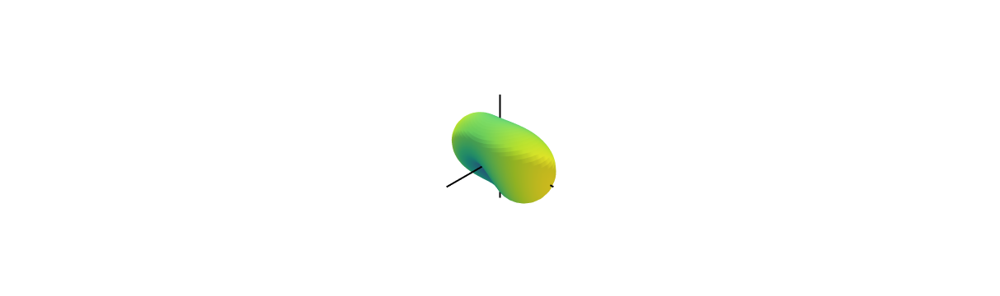

In [5]:
# Arb pol
arbPol = setBLMs(np.array([[1,0,0.3],[1,-1,0.4],[1,1,0.2]]))
Itp, fig = ep.sphFromBLMPlot(arbPol.squeeze(drop=True), plotFlag = True,  # pType='i',
                             backend='pl')  #, facetDims=['t'])

## Set pol geometries (rotations)

These default to $(x,y,z)$, and are currently used either for direct frame rotation of distributions, and in MFPAD routines. Frame rotations are defined either by a [set of Euler angles](https://en.wikipedia.org/wiki/Euler_angles), or quaternions, starting from the standard orientation ($z$-axis vertical).

Functions:
- `ep.setPolGeoms()` to set default or custom rotations.
- `ep.TKQarrayRotX()` to apply the rotations (to any spherical expansion).

(See https://epsproc.readthedocs.io/en/3d-afpad-dev/tests/ePSproc_frame_rotation_tests_Dec2019.html)

In [6]:
# Set default frame defns
RXdefault = ep.setPolGeoms()
RXdefault

<xarray.DataArray (Euler: 3)>
array([quaternion(1, -0, 0, 0),
       quaternion(0.707106781186548, -0, 0.707106781186547, 0),
       quaternion(0.5, -0.5, 0.5, 0.5)], dtype=quaternion)
Coordinates:
  * Euler    (Euler) MultiIndex
  - P        (Euler) float64 0.0 0.0 1.571
  - T        (Euler) float64 0.0 1.571 1.571
  - C        (Euler) float64 0.0 0.0 0.0
    Labels   (Euler) <U32 'z' 'x' 'y'
Attributes:
    dataType:  Euler

In [7]:
# Rotations (z,x,y) case
# This transforms ep > ep' in the rotated frame
linearPolRot, _, _ = ep.TKQarrayRotX(linearPol, RXdefault)
linearPolRot

<xarray.DataArray (t: 1, Euler: 3, BLM: 3)>
array([[[ 0.00000000e+00+0.j        ,  1.00000000e+00+0.j        ,
          0.00000000e+00+0.j        ],
        [ 7.07106781e-01+0.j        ,  2.22044605e-16+0.j        ,
         -7.07106781e-01+0.j        ],
        [ 2.00307049e-16+0.70710678j,  2.22044605e-16+0.j        ,
         -2.00307049e-16+0.70710678j]]])
Coordinates:
  * t        (t) int64 0
  * Euler    (Euler) MultiIndex
  - P        (Euler) float64 0.0 0.0 1.571
  - T        (Euler) float64 0.0 1.571 1.571
  - C        (Euler) float64 0.0 0.0 0.0
    Labels   (Euler) <U32 'z' 'x' 'y'
  * BLM      (BLM) MultiIndex
  - l        (BLM) int64 1 1 1
  - m        (BLM) int64 -1 0 1
Attributes:
    dataType:   BLM
    long_name:  Beta parameters
    units:      arb
    harmonics:  {'dtype': 'Complex harmonics', 'kind': 'complex', 'normType':...

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.4886025119029199+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


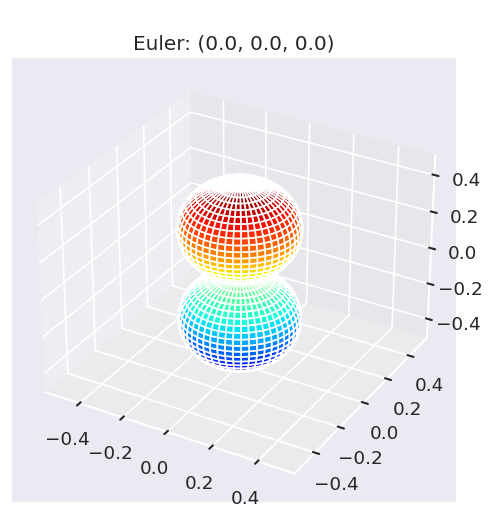

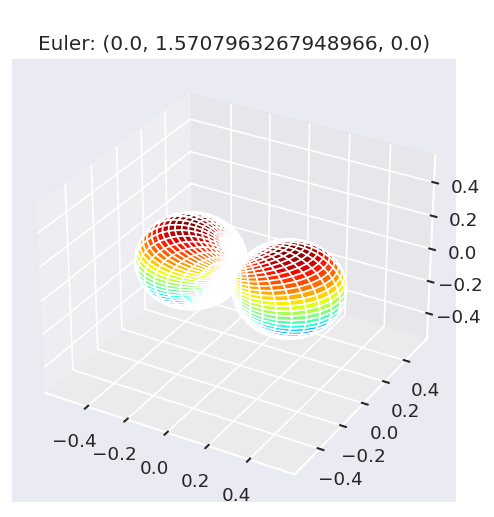

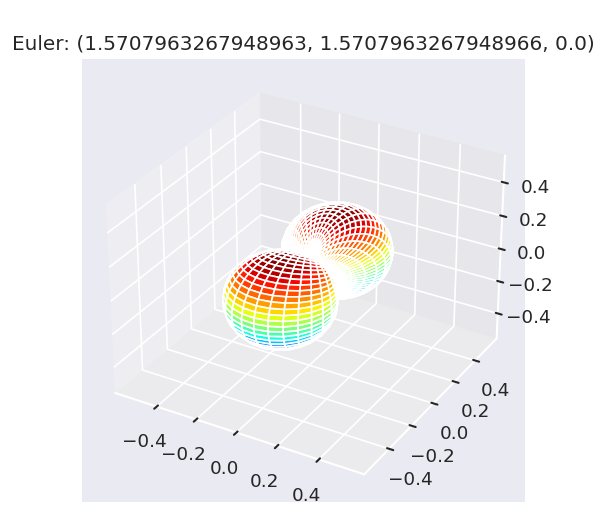

In [8]:
# Plot frame rotations.
# NOTE: facetDim not working for pl backend, nor for 'Labels'
# See base class .padPlot routine for better handling?
Itp, fig = ep.sphFromBLMPlot(linearPolRot.squeeze(drop=True), plotFlag = True,
                             backend='mpl', facetDim='Euler')

### Frame rotations with arb pol

These work the same way, with the caveat that LCP and RCP $z$-axes are usually defined as propagation direction, hence the rotated frame is usually the canonical one.

In [9]:
# Rotations (z,x,y) case
LCPRot, _, _ = ep.TKQarrayRotX(LCP, RXdefault)
LCPRot

<xarray.DataArray (t: 1, Euler: 3, BLM: 3)>
array([[[ 1.00000000e+00+0.j ,  0.00000000e+00+0.j ,
          0.00000000e+00+0.j ],
        [ 5.00000000e-01+0.j , -7.07106781e-01+0.j ,
          5.00000000e-01+0.j ],
        [ 1.41638472e-16+0.5j, -7.07106781e-01+0.j ,
          1.41638472e-16-0.5j]]])
Coordinates:
  * t        (t) int64 0
  * Euler    (Euler) MultiIndex
  - P        (Euler) float64 0.0 0.0 1.571
  - T        (Euler) float64 0.0 1.571 1.571
  - C        (Euler) float64 0.0 0.0 0.0
    Labels   (Euler) <U32 'z' 'x' 'y'
  * BLM      (BLM) MultiIndex
  - l        (BLM) int64 1 1 1
  - m        (BLM) int64 -1 0 1
Attributes:
    dataType:   BLM
    long_name:  Beta parameters
    units:      arb
    harmonics:  {'dtype': 'Complex harmonics', 'kind': 'complex', 'normType':...

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.34549414947133544+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


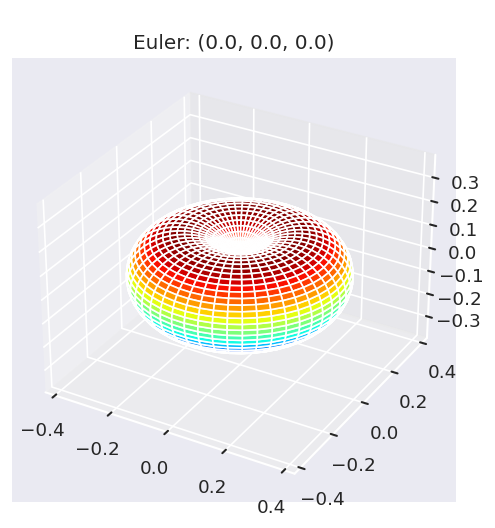

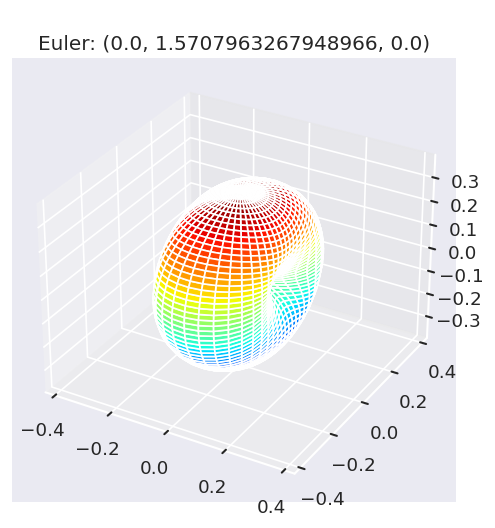

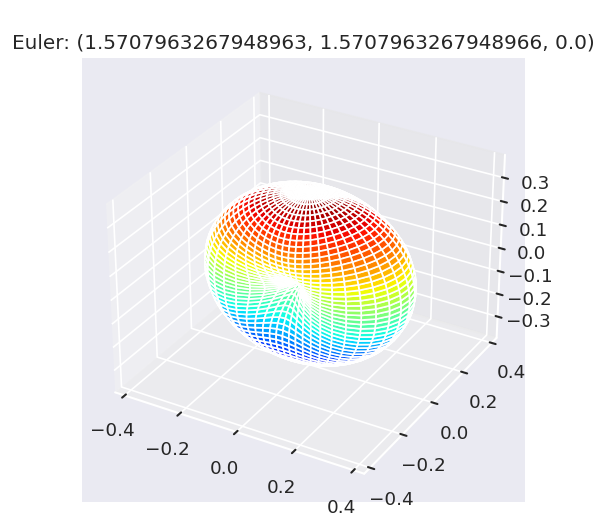

In [10]:
# Plot frame rotations.
# NOTE: facetDim not working for pl backend, nor for 'Labels'
# See base class .padPlot routine for better handling?
Itp, fig = ep.sphFromBLMPlot(LCPRot.squeeze(drop=True), plotFlag = True,
                             backend='mpl', facetDim='Euler')

In [11]:
# Rotations (z,x,y) case
arbPolRot, _, _ = ep.TKQarrayRotX(arbPol, RXdefault)
arbPolRot

<xarray.DataArray (t: 1, Euler: 3, BLM: 3)>
array([[[ 4.00000000e-01+0.j        ,  3.00000000e-01+0.j        ,
          2.00000000e-01+0.j        ],
        [ 5.12132034e-01+0.j        , -1.41421356e-01+0.j        ,
          8.78679656e-02+0.j        ],
        [ 1.45075198e-16+0.51213203j, -1.41421356e-01+0.j        ,
          2.48909689e-17-0.08786797j]]])
Coordinates:
  * t        (t) int64 0
  * Euler    (Euler) MultiIndex
  - P        (Euler) float64 0.0 0.0 1.571
  - T        (Euler) float64 0.0 1.571 1.571
  - C        (Euler) float64 0.0 0.0 0.0
    Labels   (Euler) <U32 'z' 'x' 'y'
  * BLM      (BLM) MultiIndex
  - l        (BLM) int64 1 1 1
  - m        (BLM) int64 -1 0 1
Attributes:
    dataType:   BLM
    long_name:  Beta parameters
    units:      arb
    harmonics:  {'dtype': 'Complex harmonics', 'kind': 'complex', 'normType':...

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.16198395539460675-0.00576264063312466j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


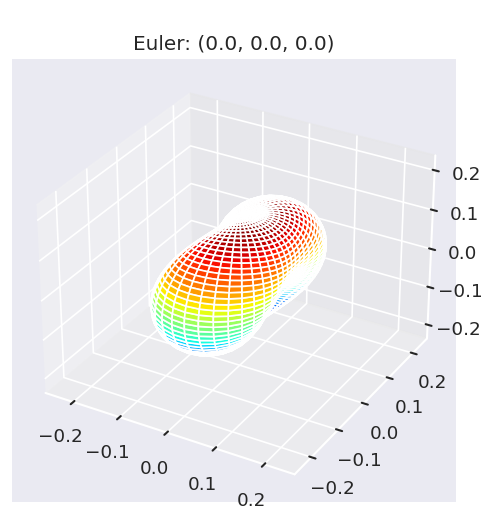

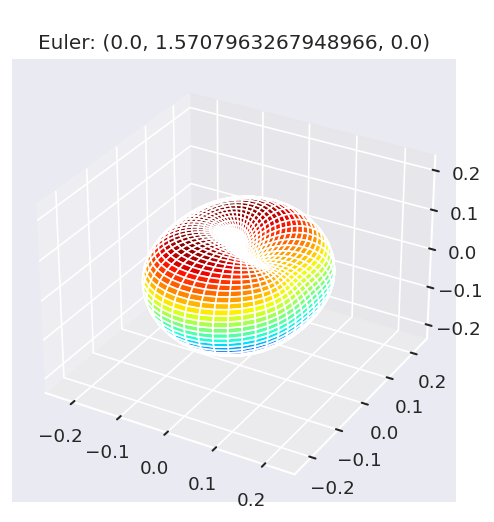

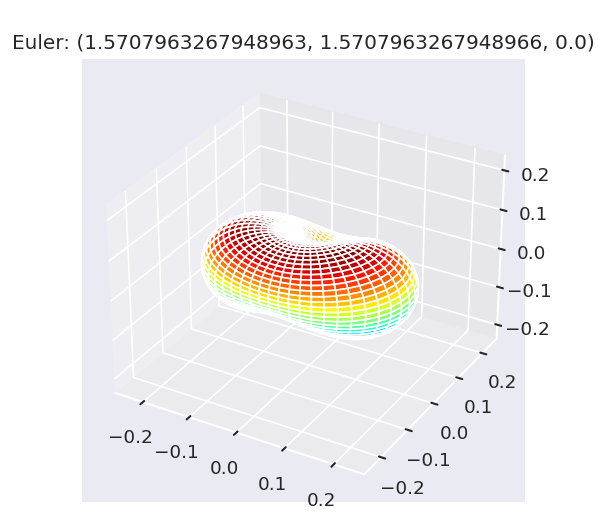

In [12]:
# Plot frame rotations.
# NOTE: facetDim not working for pl backend, nor for 'Labels'
# See base class .padPlot routine for better handling?
Itp, fig = ep.sphFromBLMPlot(arbPolRot.squeeze(drop=True), plotFlag = True,
                             backend='mpl', facetDim='Euler')

## Pol with the Epol class

In this case, use the Epol class to define polarization states. This uses $(E_x,E_y)$ or $(E_l,E_r)$ bases for field creation, and the `py_pol` library for additional functionality. This provides a way to generate various arb pol fields, with the caveat that care must be taken to correctly define the reference frame.

See [the main Epol class demo](../demos/Epol_class_demo_docs_030324.html) for details.

### Linear pol with Epol class

In [13]:
from epsproc.efield.epol import EfieldPol

# Define as (Ex,Ey)
Exy = EfieldPol(Exy=[1,0])

Set field from Exy.
[[1. 0.]]


In [14]:
# Spherical components are set from the Ex,Ey components.
Exy.Elr

array([[0.70710678+0.j, 0.70710678+0.j]])

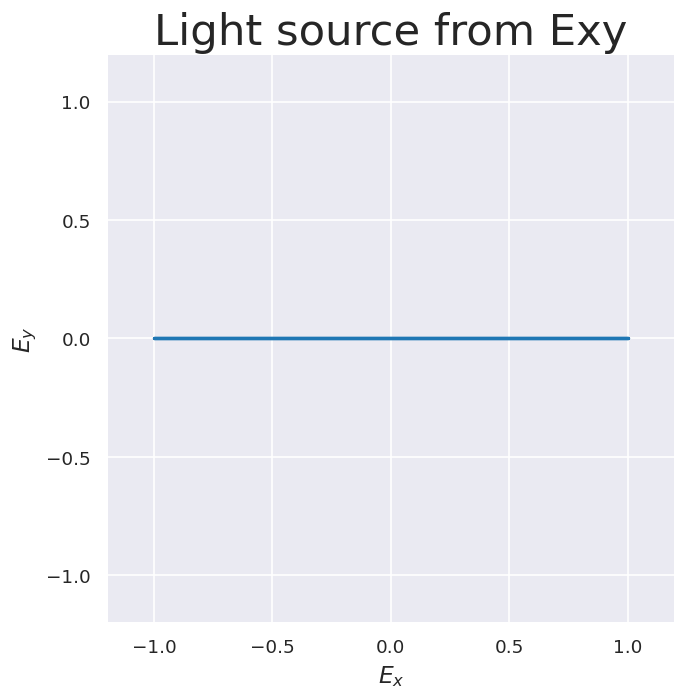

In [15]:
# With py_pol, the (Ex,Ey) field can be plotted
Exy.plot()

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.4873481053653398+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=mpl.


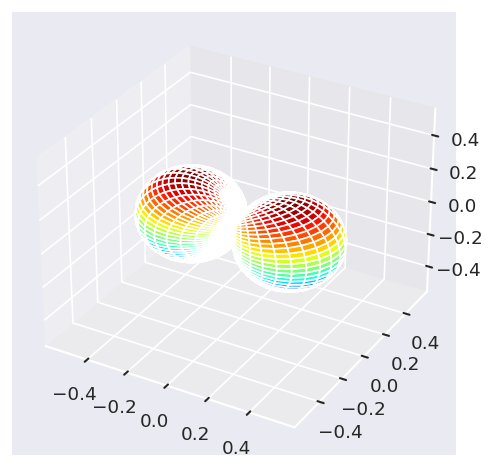

In [16]:
# The pol state can be expressed in Ylm basis with self.plotSph()
# This provides a quick way to check orientation relative to 
# the canonical definitions above.
Exy.plotSph()

In [17]:
# Frame rotations are wrapped by self.setOrientation().
# For the default case this maps Ex > Ez to match the canonical frame definition.
Exy.setOrientation()

Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.


Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.4886025119029198+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


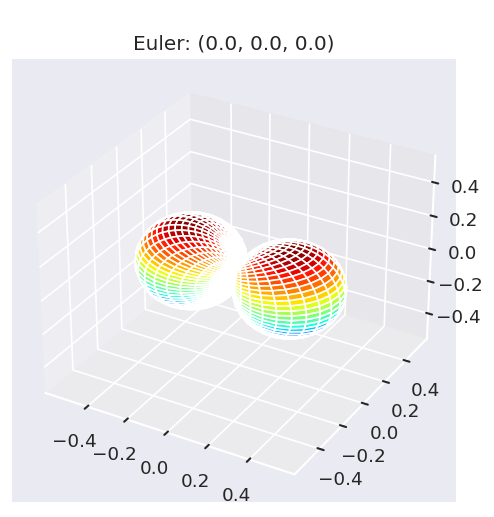

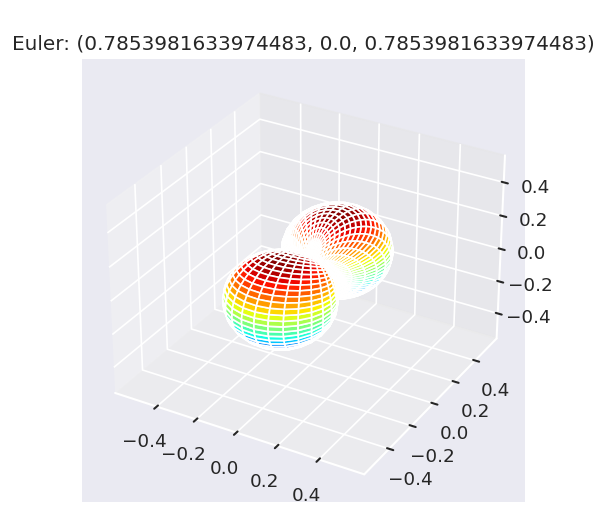

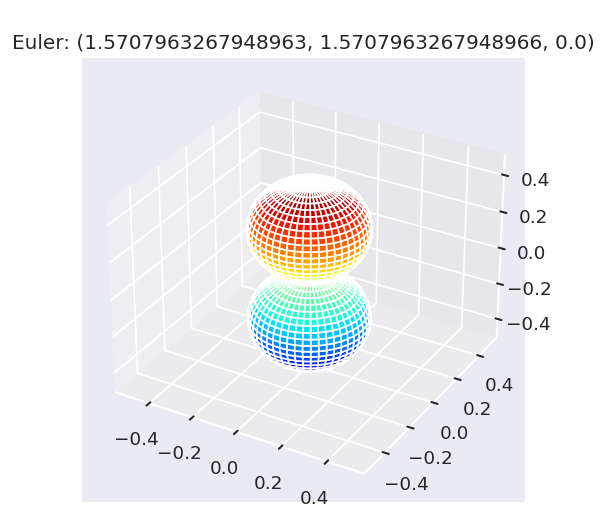

In [18]:
# Set 'dataType='rot'' to plot the rotated frames.
Exy.plotSph(dataType='rot')

### Elliptical pol with Epol class

For the elliptical case, it can be specified by  parameters `[amplitude,azimuth (0,pi), ellipticity (-pi/4,pi/4)]`. (See the [main Epol class docs for more details](demos/Epol_class_demo_docs_030324.html#Elliptical-basis).)

In [19]:
import numpy as np

# Define circ pol fields (max and min ellipticity)
Eell_RCP = EfieldPol(ell=[1,0,np.pi/4])
Eell_LCP = EfieldPol(ell=[1,0,-np.pi/4])

# Define arb ellipticity
Eell_mixed = EfieldPol(ell=[1,0,0.25*np.pi/4])
Eell_rotated = EfieldPol(ell=[1,np.pi/3,0.25*np.pi/4])

Set field from ell.
[[1.         0.         0.78539816]]
Set field from ell.
[[ 1.          0.         -0.78539816]]
Set field from ell.
[[1.         0.         0.19634954]]
Set field from ell.
[[1.         1.04719755 0.19634954]]


Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.45384144299916224-0.14775656726827413j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=mpl.


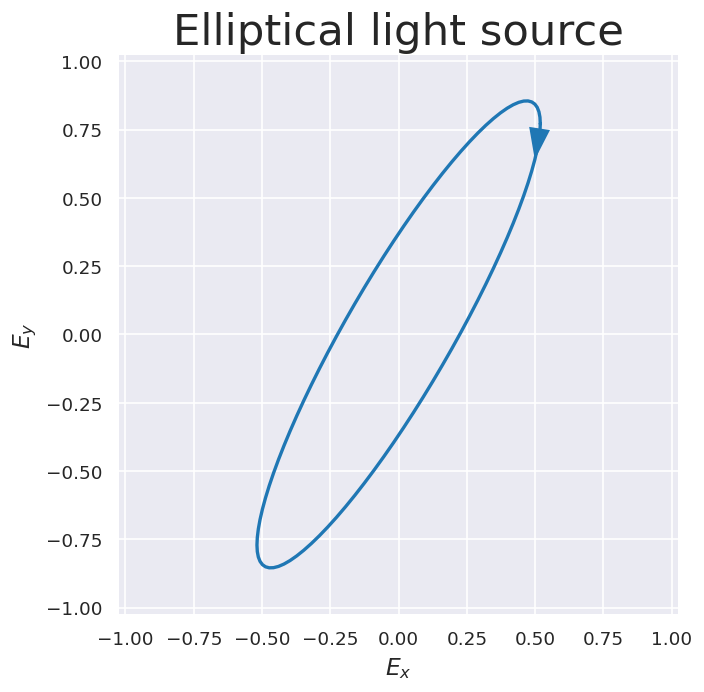

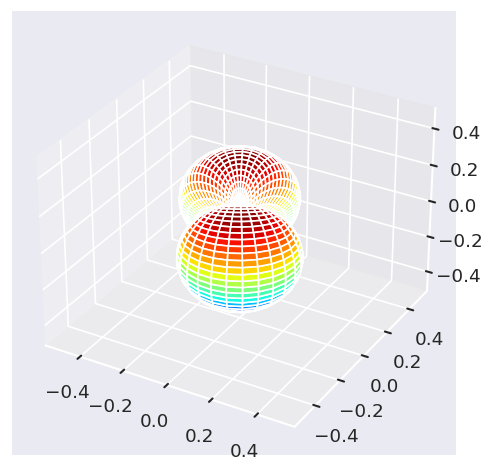

In [20]:
# Check field
Eell_rotated.plot()
Eell_rotated.plotSph()

Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.4538564795163549-0.15098416308662493j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


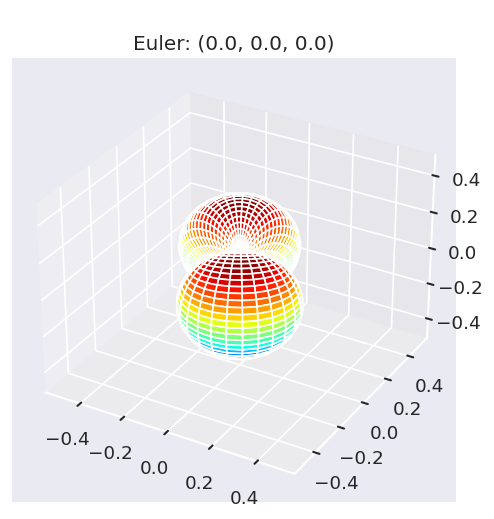

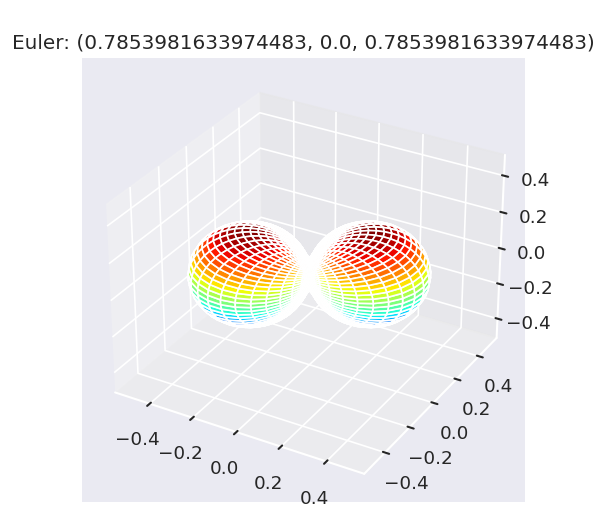

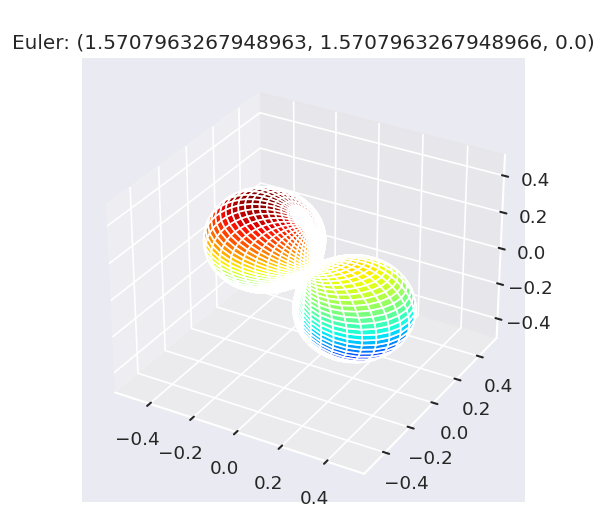

In [21]:
# Set/map frame to default geoms

# Frame rotations are wrapped by self.setOrientation().
# For the default case this maps Ex > Ez to match the canonical frame definition.
Eell_rotated.setOrientation()

# Set 'dataType='rot'' to plot the rotated frames.
Eell_rotated.plotSph(dataType='rot')

Note in this case that the default mapping maintains the diagonal polarization state in the $(x,z)$ plane in the final transformation.

### Arb frame rotations with Epol class

In somes cases, the default rotations may not be what we want, so we can set manually instead...

Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.4538564795163549-0.15098416308662493j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


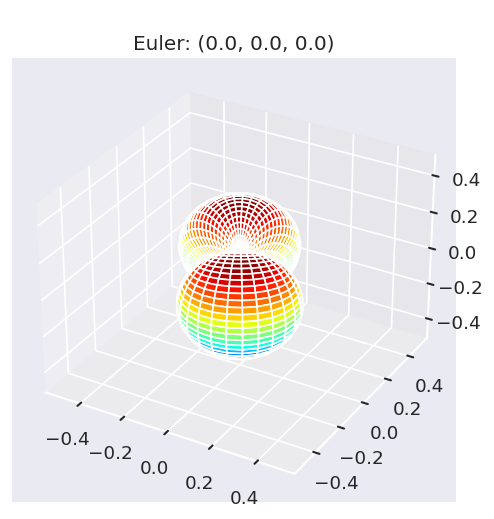

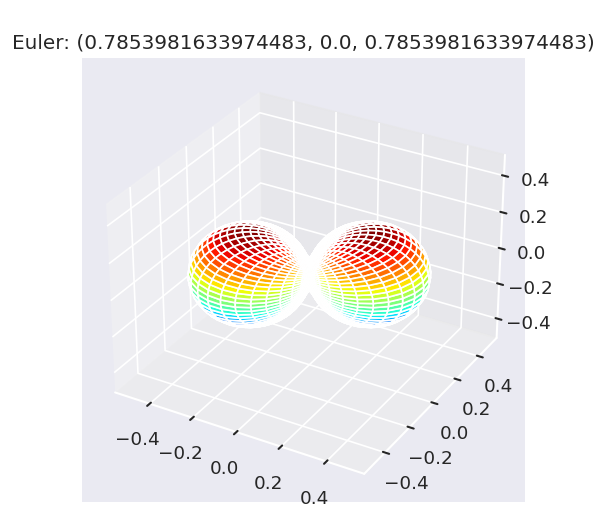

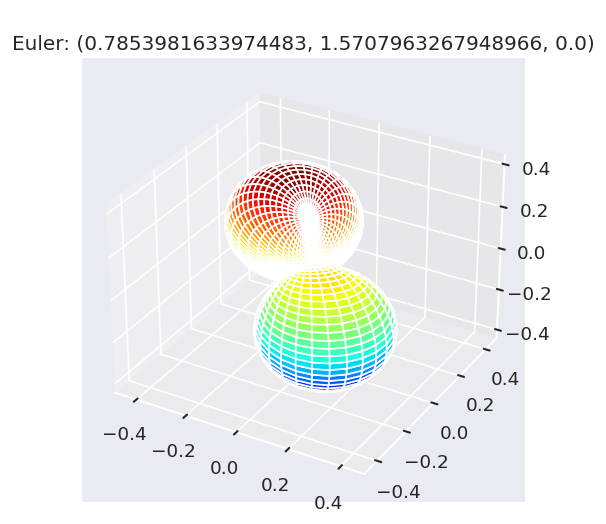

In [22]:
# Test alternative z mappings - custom case
pRot = [0, np.pi/2, np.pi/4]
tRot = [0, 0, np.pi/2]
cRot = [0, 0, 0]
labels = ['x', 'y', 'z']

eulerAngsEpol = np.array([pRot, tRot, cRot]).T

RXEpol=ep.setPolGeoms(eulerAngs = eulerAngsEpol, labels = labels)

Eell_rotated.setOrientation(RX=RXEpol)

# Set 'dataType='rot'' to plot the rotated frames.
Eell_rotated.plotSph(dataType='rot')

Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.479214151642428+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


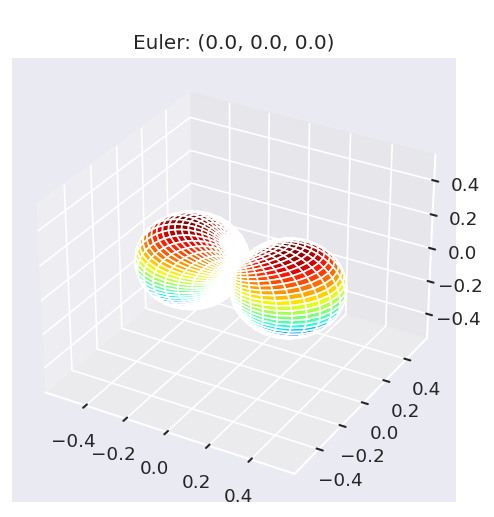

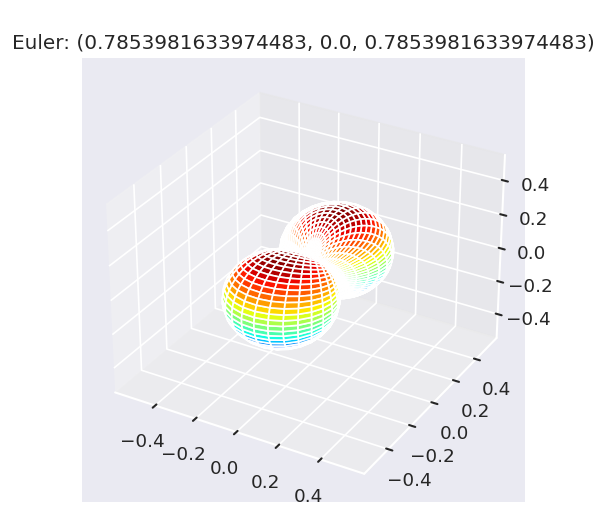

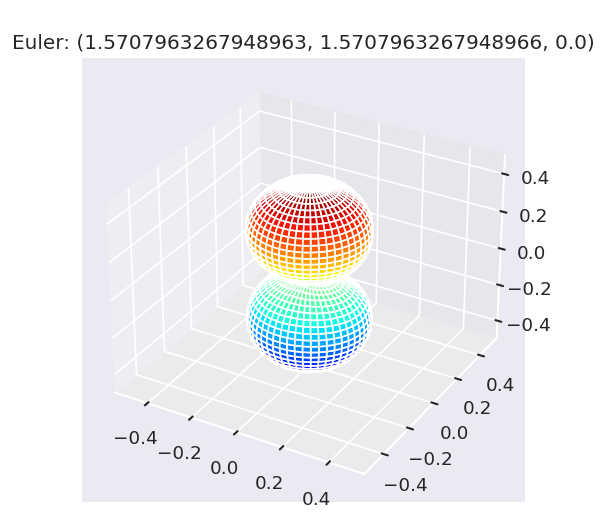

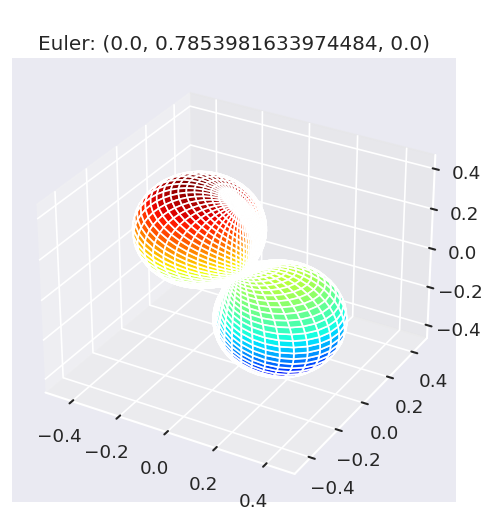

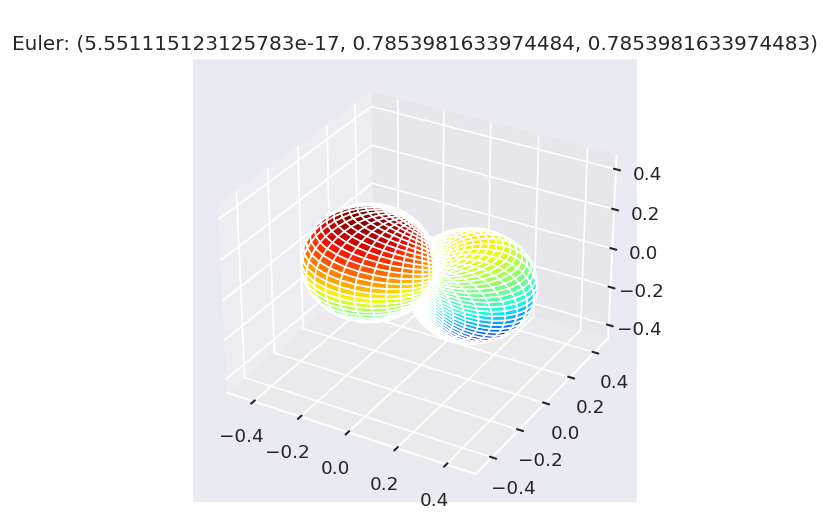

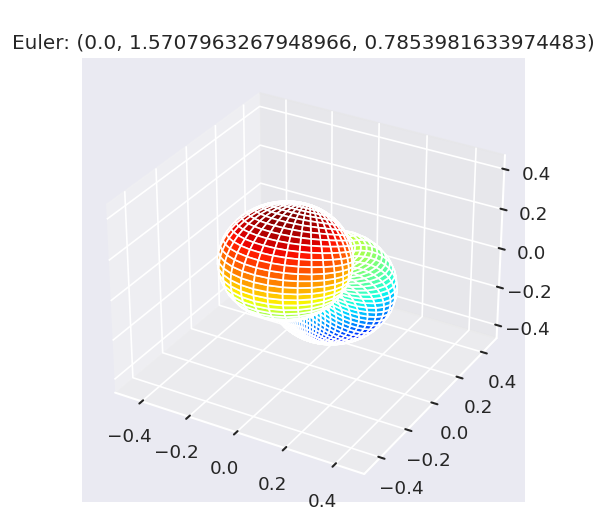

In [23]:
# Set mappings using those available in ep.setPolGeoms()

# Set mapping including "diagonal" pol geometries
Eell_mixed.setOrientation(mapping='exyDiag')
Eell_mixed.plotSph(dataType='rot')

## Molecular frame example ($N_2$)

Quick demo as per the [main class intro docs](ePSproc_class_demo_161020.html).

### Import matrix elements

In [24]:
# Import
import epsproc as ep  
from pathlib import Path

# Set data path
# Note this is set here from ep.__path__, but may not be correct in all cases - depends on where the Github repo is.
epDemoDataPath = Path(ep.__path__[0]).parent/'data'
dataPath = epDemoDataPath/'photoionization'/'n2_multiorb'


In [25]:
# Class dev code
from epsproc.classes.multiJob import ePSmultiJob
from epsproc.classes.base import ePSbase

# Instantiate class object.
# Minimally this needs just the dataPath, if verbose = 1 is set then some useful output will also be printed.
data = ePSbase(dataPath, verbose = 1)

# ScanFiles() - this will look for data files on the path provided, and read from them.
data.scanFiles()


*** Job orb6 details
Key: orb6
Dir /home/jovyan/github/ePSproc/data/photoionization/n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.09691397835426,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir /home/jovyan/github/ePSproc/data/photoionization/n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.34181645456815,
    'orbLabel': '3sg-1'}


*** Molecular structure


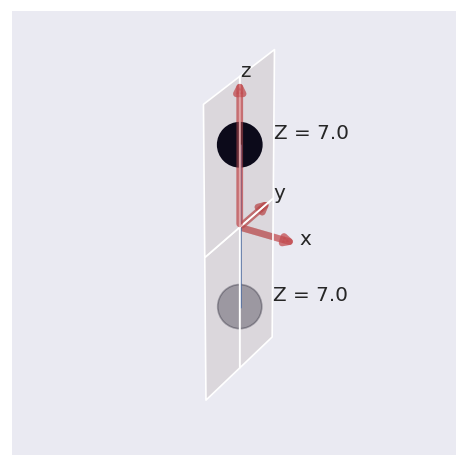


*** Molecular orbital list (from ePS output file)
EH = Energy (Hartrees), E = Energy (eV), NOrbGrp, OrbGrp, GrpDegen = degeneracies and corresponding orbital numbering by group in ePS, NormInt = single centre expansion convergence (should be ~1.0).


props,Sym,EH,Occ,E,NOrbGrp,OrbGrp,GrpDegen,NormInt
orb,,,,,,,,
1,SG,-15.6719,2.0,-426.454124,1.0,1.0,1.0,0.999532
2,SU,-15.6676,2.0,-426.337115,1.0,2.0,1.0,0.999458
3,SG,-1.4948,2.0,-40.675580,1.0,3.0,1.0,0.999979
4,SU,-0.7687,2.0,-20.917393,1.0,4.0,1.0,0.999979
5,SG,-0.6373,2.0,-17.341816,1.0,5.0,1.0,1.000000
6,PU,-0.6283,2.0,-17.096914,1.0,6.0,2.0,1.000000
7,PU,-0.6283,2.0,-17.096914,2.0,6.0,2.0,1.000000


In [26]:
# Plot molecule
data.molSummary()

#### Compute MFPADs

In [27]:
# Use Epol class object as Einput, just needs self.epDict to be passed.
Einput = Eell_rotated
# Einput = Eell_mixed
# Einput = Exy  

# Set params for MFBLM calculation
Einput.setep()

Einput.setOrientation()  # To ensure frame settings for Epol, run self.setOrientation.
                         # Otherwise MFBLM computation will use defaults.

# Run standard calculation with inputs from Epol
data.MFBLM(**Einput.epDict)

Set parameters to `self.epDict` and `self.epXR`.
Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Set orientations to self.epDict['RX'].

Calculating MF-BLMs for job key: orb6

Calculating MF-BLMs for job key: orb5


Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb5][MFBLM], facetDims=['Labels', 'Eke'], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.9170579393195512-4.4027847881751057e-16j). This may be unphysical and/or result in plotting issues.


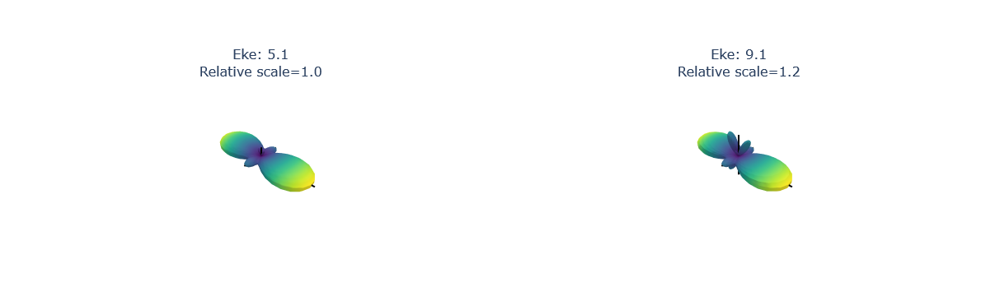

*** WARNING: plot dataset has min value < 0, min = (-0.9135561079258192-0.04178903008200526j). This may be unphysical and/or result in plotting issues.


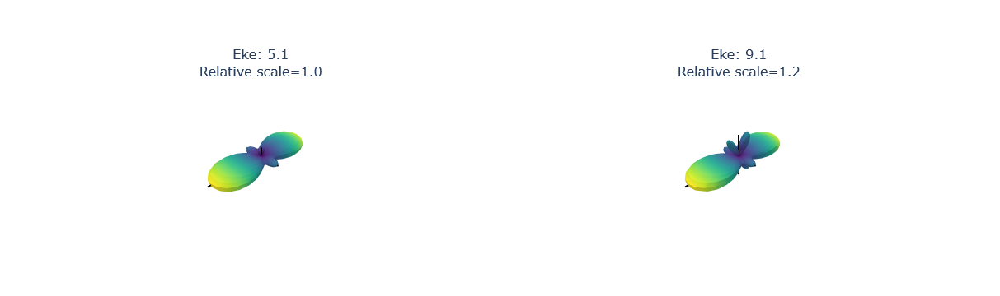

*** WARNING: plot dataset has min value < 0, min = (-57.01986913204973+2.3598064669476346j). This may be unphysical and/or result in plotting issues.


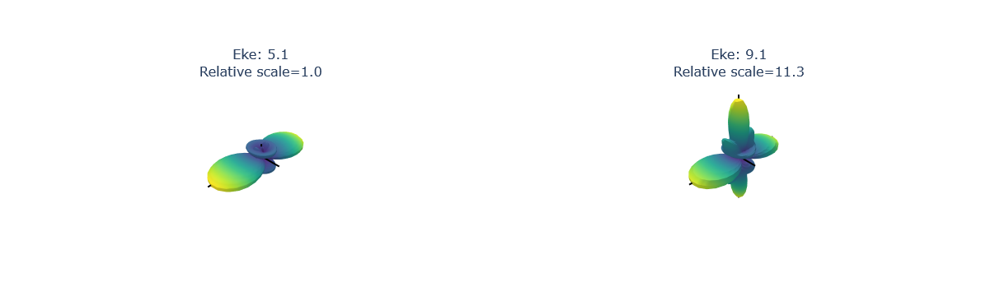

Set plot to self.data['orb5']['plots']['MFBLM']['polar']


In [28]:
# data.BLMplot(dataType='MFBLM', thres = 1e-2, backend='hv', Erange=[0,15], ylim=(-1.5, 2.5), width=800)
data.padPlot(keys = 'orb5', Erange = [5, 10, 4], dataType='MFBLM', backend='pl', returnFlag=True)

## Versions

In [29]:
import scooby
scooby.Report(additional=['epsproc', 'holoviews', 'hvplot', 'xarray', 'matplotlib', 'bokeh', 'plotly'])

--------------------------------------------------------------------------------
  Date: Fri Mar 15 10:19:45 2024 EDT

                OS : Linux
            CPU(s) : 64
           Machine : x86_64
      Architecture : 64bit
               RAM : 62.8 GiB
       Environment : Jupyter
       File system : btrfs

  Python 3.10.11 | packaged by conda-forge | (main, May 10 2023, 18:58:44)
  [GCC 11.3.0]

           epsproc : 1.3.2-dev
         holoviews : 1.16.2
            hvplot : 0.8.4
            xarray : 2022.3.0
        matplotlib : 3.5.3
             bokeh : 3.1.1
            plotly : 5.15.0
             numpy : 1.23.5
             scipy : 1.10.1
           IPython : 8.13.2
            scooby : 0.7.2
--------------------------------------------------------------------------------

In [30]:
# Check current Git commit for local ePSproc version
from pathlib import Path
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1

* 3d-AFPAD-dev
0c68709cecb770648ff65e21ad3ae65b2699fb26


In [31]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/ePSproc

0c68709cecb770648ff65e21ad3ae65b2699fb26	refs/heads/3d-AFPAD-dev
7e4270370d66df44c334675ac487c87d702408da	refs/heads/dev
1c0b8fd409648f07c85f4f20628b5ea7627e0c4e	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master
baf0be0c962e8ab3c3df57c8f70f0e939f99cbd7	refs/heads/testDev
